In [37]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer, WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer # tfidf weighting
from sklearn.feature_extraction.text import CountVectorizer #frequency distribution
import re
import os
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest, RandomForestClassifier
from sklearn.covariance import EllipticEnvelope # Mahalanobis Distance
import numpy as np
import umap
from umap.umap_ import UMAP
import matplotlib.pyplot as plt
import pickle
import plotly.express as px
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, recall_score, precision_score,f1_score, make_scorer
from sklearn.neighbors import KNeighborsClassifier
import seaborn as sns
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.manifold import LocallyLinearEmbedding, TSNE
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import HistGradientBoostingClassifier
'''nltk.download('stopwords')

nltk.download('wordnet')

nltk.download('punkt')'''

%cd "/Users/keeganmoseley/Desktop/Roux/CS6140 - Machine Learning/Final Project"
os.listdir()
cuneiform_whole = pd.read_csv("train.csv")
cuneiform_df = cuneiform_whole.sample(frac=0.25, random_state=251)
cuneiform_df.reset_index(drop=True, inplace = True)



[WinError 3] The system cannot find the path specified: '/Users/keeganmoseley/Desktop/Roux/CS6140 - Machine Learning/Final Project'
c:\Users\keega\Desktop\Coding\ML Final


In [38]:
display(cuneiform_df)

,cuneiform,lang
0,𒄯𒈨𒌍𒊓𒀭𒋾𒅟,NEA
1,𒀀𒈾𒂗𒈨𒌍𒋙,NEA
2,𒋫𒅅,SUX
3,𒊹𒈠𒈾𒆬𒌓𒈨𒌍,NEA
4,𒂍𒑏𒑏𒑏𒋦𒊹𒇻𒁀𒀾𒀀𒈾𒀭,NEA
...,...,...
34850,𒌑𒁀𒀾𒋆𒌋𒌋𒍝𒍝𒁹𒀭𒀭,NEA
34851,𒁹𒁹𒁹𒌋𒈬𒁉𒅎,SUX
34852,𒁹𒀭𒌓𒅁𒉌,NEB
34853,𒈬𒆥𒈾𒀜𒁕𒄉𒈨,STB


In [39]:
#tokenize the data
def tokenize(text):
    return([*text])

cuneiform_df['characters'] = cuneiform_df['cuneiform'].apply(tokenize)

all_characters = set()

for index, row in cuneiform_df.iterrows():
    cuneiform_value = row['characters']
    row_set = set(cuneiform_value)
    all_characters = all_characters.union(row_set)

print(len(all_characters))

485


In [40]:
vectorizer = TfidfVectorizer(analyzer='char', min_df=0.02)

#train the model
vectorizer_results = vectorizer.fit_transform(cuneiform_df["cuneiform"])

#turn results into a document term matrix
dense_matrix = vectorizer_results.todense()   

# Retrieve feature names (tokens)
feature_names = vectorizer.get_feature_names_out() 

# Create a DataFrame with the dense matrix and feature names as columns
tfidf_df = pd.DataFrame(dense_matrix, columns=feature_names)

# Display the DataFrame
display(tfidf_df)

,𒀀,𒀉,𒀜,𒀭,𒀸,𒁀,𒁁,𒁉,𒁍,𒁕,...,𒌋,𒌍,𒌑,𒌓,𒌦,𒌨,𒌷,𒍑,𒍝,𒍣
0,0.000000,0.0,0.000000,0.354207,0.0,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.441695,0.00000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
1,0.297105,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.428802,0.00000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
2,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
3,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.452545,0.00000,0.413274,0.0,0.0,0.0,0.0,0.000000,0.0
4,0.272917,0.0,0.000000,0.315872,0.0,0.456792,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34850,0.000000,0.0,0.000000,0.400230,0.0,0.289392,0.000000,0.000000,0.0,0.000000,...,0.482344,0.000000,0.24806,0.000000,0.0,0.0,0.0,0.0,0.625766,0.0
34851,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.288682,0.0,0.000000,...,0.246958,0.000000,0.00000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
34852,0.000000,0.0,0.000000,0.431902,0.0,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,0.00000,0.491843,0.0,0.0,0.0,0.0,0.000000,0.0
34853,0.000000,0.0,0.572317,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.493434,...,0.000000,0.000000,0.00000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0


In [41]:
#create a correlation matrix 
NUM_COLUMNS = 50
total_columns = tfidf_df.shape[1]

# Set a random seed for reproducibility
np.random.seed(251)

# Generate 50 random column indices
random_column_indices = np.random.choice(total_columns, NUM_COLUMNS, replace=False)

# Extract the selected columns from the DataFrame
selected_columns = tfidf_df.iloc[:, random_column_indices]

# Display the selected columns
print(selected_columns)

              𒊕    𒌆        𒌑    𒈪    𒇽         𒁁    𒋢         𒋫         𒁉  \
0      0.000000  0.0  0.00000  0.0  0.0  0.000000  0.0  0.000000  0.000000   
1      0.000000  0.0  0.00000  0.0  0.0  0.000000  0.0  0.000000  0.000000   
2      0.000000  0.0  0.00000  0.0  0.0  0.000000  0.0  0.612622  0.000000   
3      0.000000  0.0  0.00000  0.0  0.0  0.000000  0.0  0.000000  0.000000   
4      0.000000  0.0  0.00000  0.0  0.0  0.000000  0.0  0.000000  0.000000   
...         ...  ...      ...  ...  ...       ...  ...       ...       ...   
34850  0.000000  0.0  0.24806  0.0  0.0  0.000000  0.0  0.000000  0.000000   
34851  0.000000  0.0  0.00000  0.0  0.0  0.000000  0.0  0.000000  0.288682   
34852  0.000000  0.0  0.00000  0.0  0.0  0.000000  0.0  0.000000  0.000000   
34853  0.000000  0.0  0.00000  0.0  0.0  0.000000  0.0  0.000000  0.000000   
34854  0.737974  0.0  0.00000  0.0  0.0  0.674829  0.0  0.000000  0.000000   

         𒌉  ...    𒄭    𒆷         𒋾         𒊹    𒊏    𒌨    𒊮   

c:\Users\keega\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\utils.py:84: UserWarning:

Glyph 74389 (\N{CUNEIFORM SIGN SAG}) missing from current font.

c:\Users\keega\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\utils.py:84: UserWarning:

Glyph 74502 (\N{CUNEIFORM SIGN TUG2}) missing from current font.

c:\Users\keega\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\utils.py:84: UserWarning:

Glyph 74513 (\N{CUNEIFORM SIGN U2}) missing from current font.

c:\Users\keega\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\utils.py:84: UserWarning:

Glyph 74282 (\N{CUNEIFORM SIGN MI}) missing from current font.

c:\Users\keega\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\utils.py:84: UserWarning:

Glyph 74237 (\N{CUNEIFORM SIGN LU2}) missing from current font.

c:\Users\keega\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\utils.py:84: UserWarning:

Glyph 73793 (\N{CUNEIFORM SI

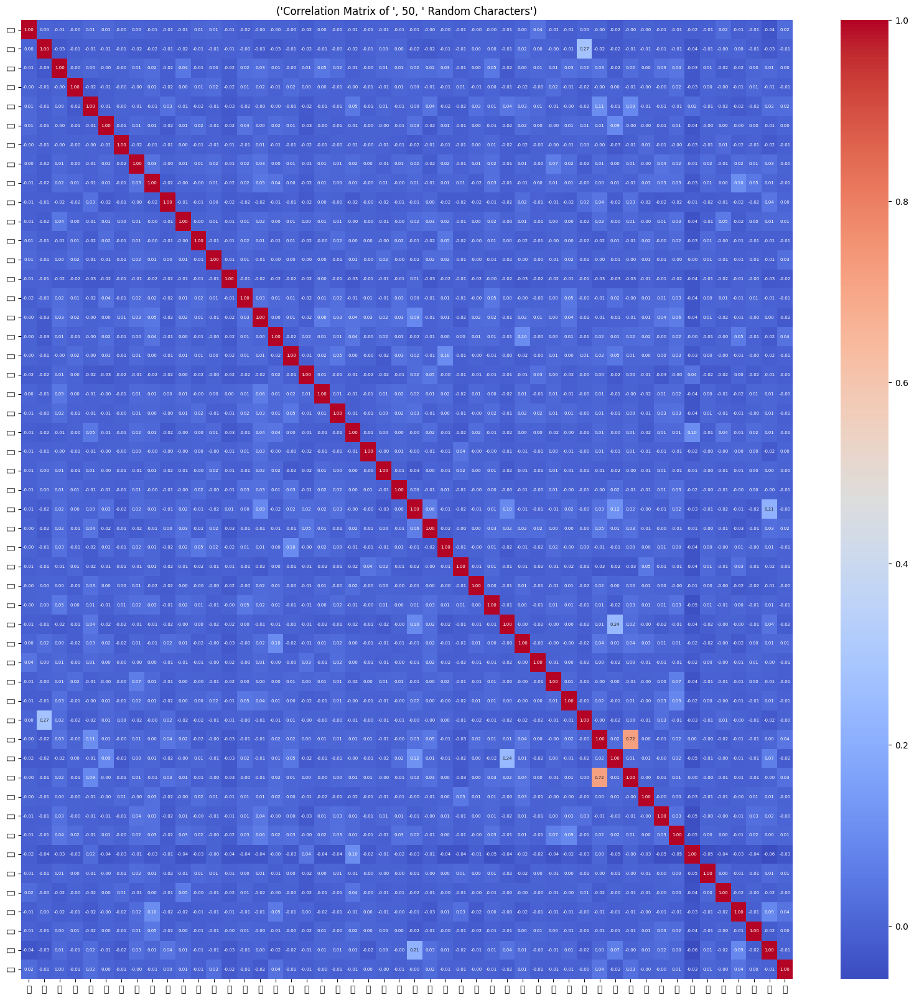

In [42]:
correlation_matrix = selected_columns.corr()
correlation_df = pd.DataFrame(correlation_matrix, columns=correlation_matrix.columns, index=correlation_matrix.index)
title = "Correlation Matrix of ", NUM_COLUMNS, " Random Characters"
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f",annot_kws={"size": 5})
plt.title(title)
plt.show()

In [43]:
display(correlation_df)

,𒊕,𒌆,𒌑,𒈪,𒇽,𒁁,𒋢,𒋫,𒁉,𒌉,...,𒄭,𒆷,𒋾,𒊹,𒊏,𒌨,𒊮,𒅅,𒀀,𒂍
𒊕,1.000000,0.001181,-0.005548,-0.004763,0.010640,0.009464,-0.004092,0.002709,-0.008192,-0.008992,...,-0.004153,-0.010423,-0.011599,-0.016776,-0.011261,0.019341,-0.014788,-0.005171,-0.036765,0.017086
𒌆,0.001181,1.000000,-0.025872,-0.014478,-0.011834,-0.011181,-0.010691,-0.017284,-0.018305,-0.009813,...,-0.008328,-0.009008,-0.008395,-0.036728,-0.010397,-0.001769,0.000319,-0.013205,-0.026619,-0.007690
𒌑,-0.005548,-0.025872,1.000000,-0.002411,0.003979,-0.002190,-0.003604,0.011062,0.021485,-0.016910,...,0.001469,0.029366,0.042878,-0.031895,0.007477,-0.019789,-0.016093,0.004743,0.014605,0.001964
𒈪,-0.004763,-0.014478,-0.002411,1.000000,-0.022427,-0.013274,-0.001314,-0.002083,0.012344,-0.017128,...,-0.001923,-0.002161,0.024004,-0.030152,0.002139,-0.003493,-0.012160,0.008223,-0.008732,-0.011120
𒇽,0.010640,-0.011834,0.003979,-0.022427,1.000000,-0.010495,-0.003924,-0.008380,-0.008303,0.030548,...,-0.007840,-0.008617,-0.007163,0.017977,-0.008206,-0.016874,-0.021990,-0.016588,0.024017,0.022671
𒁁,0.009464,-0.011181,-0.002190,-0.013274,-0.010495,1.000000,-0.006448,0.009184,0.007570,-0.022744,...,-0.002900,-0.010619,0.009316,-0.036872,-0.003381,0.000898,-0.000286,0.003129,-0.009491,0.001897
𒋢,-0.004092,-0.010691,-0.003604,-0.001314,-0.003924,-0.006448,1.000000,-0.015453,-0.009663,-0.014012,...,0.014708,-0.011121,-0.002771,-0.026351,-0.008696,0.014484,-0.016846,-0.005292,-0.024966,-0.009229
𒋫,0.002709,-0.017284,0.011062,-0.002083,-0.008380,0.009184,-0.015453,1.000000,0.034858,-0.004789,...,-0.004051,0.040011,0.021842,-0.011094,0.016824,-0.012848,0.018014,0.013161,0.025337,-0.003524
𒁉,-0.008192,-0.018305,0.021485,0.012344,-0.008303,0.007570,-0.009663,0.034858,1.000000,-0.021258,...,0.025967,0.032223,0.025915,-0.032099,0.010916,0.002818,0.104434,0.049511,0.007161,-0.005911
𒌉,-0.008992,-0.009813,-0.016910,-0.017128,0.030548,-0.022744,-0.014012,-0.004789,-0.021258,1.000000,...,-0.021078,-0.021570,-0.017622,-0.013686,-0.019055,-0.014426,-0.016453,-0.015646,0.041781,0.001448


In [44]:
#MY FINDINGS:
#With vectorizer = TfidfVectorizer(analyzer='char', min_df=0.02) I get much higher correlation. So higher correlation between the common characters. FYI reduces to 81 cols

#### Now That I know correlations exist, use PCA to reduce dimensions. Then, use multiple classification algos to assess the success

Need to assess:
- Is removing uncommon characters via min freq good or bad. Intuition says bad, since rare characters are useful for identification
- use multiple PCA algos
- use stock Random Forrest to assess
- Is outlier removal good or bad (just check manually once I have the best results)

Need a function that will:
- Input cuneiform data - cuneiform_df
- Input params for DTM - vectorizer (just throw in the entire vectorizer tbh)
- input PCA algo 
- input RF algo
Returns:
- test and train datasets, PCA results, RF predictions

In [45]:

'''
Inputs: 
    cuneiform_df - dataframe of all cuneiform data
    vectorizer - vectorizer to apply to the data
    pca - pca algo to apply
Returns:
    - array
    array[0] = x_train pca results
    array[1] = x_test pca results
    array[2] = y_train
    array[3] = y_test
    array[4] = variance df
'''
def pca_assessment(cuneiform_df, vectorizer, pca):
    #split the data into training and testing sets
    X = cuneiform_df['cuneiform']
    y = cuneiform_df['lang']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=251)

    train_df = pd.DataFrame({'cuneiform': X_train, 'lang': y_train})
    test_df = pd.DataFrame({'cuneiform': X_test, 'lang': y_test})
    train_df.sort_values(by='lang', inplace=True)
    test_df.sort_values(by='lang', inplace=True)

    train_df.reset_index(drop=True, inplace = True)
    test_df.reset_index(drop=True, inplace = True)

    print("Data has been split!")

    #-----------------------Create a DTM---------------------------------------------

    #train the model
    tfidf_model = vectorizer.fit(train_df["cuneiform"])

    #apply it to the training data
    tfidf_matrix_train = vectorizer.transform(train_df["cuneiform"])

    #turn results into a document term matrix
    dense_matrix_train = tfidf_matrix_train.todense()   

    # Retrieve feature names (tokens)
    feature_names = vectorizer.get_feature_names_out() 

    # Create a DataFrame with the dense matrix and feature names as columns
    tfidf_df_train = pd.DataFrame(dense_matrix_train, columns=feature_names)

    #Create document term matrix of Test data
    tfidf_matrix_test = vectorizer.transform(test_df["cuneiform"])

    #turn results into a document term matrix
    dense_matrix_test = tfidf_matrix_test.todense()   

    # Retrieve feature names (tokens)
    feature_names = vectorizer.get_feature_names_out() 

    # Create a DataFrame with the dense matrix and feature names as columns
    tfidf_df_test = pd.DataFrame(dense_matrix_test, columns=feature_names)

    #----------------------- Preprocess and Standardize the Data ----------------------

    #Standardize data
    scaler = StandardScaler()
    scaler.fit(tfidf_df_train)
    training_df_standardized = pd.DataFrame(scaler.transform(tfidf_df_train), columns=tfidf_df_train.columns) #dataframe of standardized data
    test_df_standardized = pd.DataFrame(scaler.transform(tfidf_df_test), columns=tfidf_df_test.columns)

    #find local outliers with LOF
    lof = LocalOutlierFactor(n_neighbors=20, contamination=0.01)
    # predict the labels for each data point (as Outlier or inlier)
    pred_lof = lof.fit_predict(training_df_standardized)

    #find outliers with isolation forrest
    iforest = IsolationForest(n_estimators=100,  contamination=0.01)
    # predict the labels for each data point (as Outlier or inlier)
    pred_if = iforest.fit_predict(training_df_standardized)

    #Add columns of the outlier results
    training_df_standardized["pred_lof"] = pred_lof
    training_df_standardized["pred_if"] = pred_if

    '''#find how many outliers there are
    lof_count = (training_df_standardized["pred_lof"] == -1).sum()
    if_count = (training_df_standardized["pred_if"] == -1).sum()
    total_count = ((training_df_standardized["pred_lof"] == -1) & (training_df_standardized["pred_if"] == -1)).sum()

    print("Outliers found by Local Outlier Factor :", lof_count)
    print("Outliers found by Isolation Forrest : ",if_count)
    print("Outliers Tagged by Both : ",total_count)

    percentage_outliers = (lof_count + if_count)/(training_df_standardized.shape[0])
    print(percentage_outliers * 100,'% of the training data are outliers')'''

    #remove the outliers
    outliers = training_df_standardized[(training_df_standardized["pred_lof"] == -1) | (training_df_standardized["pred_if"] == -1)][["pred_lof", "pred_if"]]
    #print("Outliers Found By Either Algorithm :")
    #display(outliers)

    #remove outliers from dataframe
    outlier_indices = outliers.index
    training_df_standardized.drop(outlier_indices, axis=0)
    train_df.drop(outlier_indices, axis= 0)


    # ---------------------------- Dimension Reduction -------------------------
    x_subset_train = training_df_standardized.drop(['pred_lof', 'pred_if'], axis=1).values
    y_subset_train = train_df["lang"].values

    x_subset_test = test_df_standardized.values
    y_subset_test = test_df["lang"].values

    pca_trained = pca.fit(x_subset_train)
    pca_train_results = pca_trained.transform(x_subset_train)
    pca_test_results = pca_trained.transform(x_subset_test)

    #evaluate the pc variance captured
    explained_variance_ratio = pca_trained.explained_variance_ratio_
    variance_df = pd.DataFrame(data={
        'Principal Component': [f'PC{i+1}' for i in range(len(explained_variance_ratio))],
        'Explained Variance' : explained_variance_ratio,
        'Cumulative Variance' : explained_variance_ratio.cumsum()
    })

    return [pca_train_results, pca_test_results, y_subset_train, y_subset_test, variance_df]

#stock
results_1 = pca_assessment(cuneiform_df, TfidfVectorizer(analyzer='char'), PCA(n_components=50, random_state=251))
#only common chars
results_2 = pca_assessment(cuneiform_df, TfidfVectorizer(analyzer='char', min_df=0.02), PCA(n_components=50, random_state=251))
#using svd w/ 100
results_3 = pca_assessment(cuneiform_df, TfidfVectorizer(analyzer='char'), TruncatedSVD(n_components=100, random_state=251))
#using svd w/ 50 and Count Vectorizer
results_4 = pca_assessment(cuneiform_df, CountVectorizer(analyzer='char'), TruncatedSVD(n_components=50, random_state=251))
#using svd with 50
results_5 = pca_assessment(cuneiform_df, TfidfVectorizer(analyzer='char'), TruncatedSVD(n_components=50, random_state=251))
#using svd with 200
results_6 = pca_assessment(cuneiform_df, TfidfVectorizer(analyzer='char'), TruncatedSVD(n_components=200, random_state=251))


print("RESULT 1: Results using TFIDF, then 50 Component PCA")
display(results_1[4])
print("\nRESULT 2: Results using TFIDF to get more common symbols, then 50 Component PCA")
display(results_2[4])
print("\nRESULT 3: Results using TFIDF, then 100 Component Truncated SVD")
display(results_3[4])
print("\nRESULT 4: Results using CountVectorizer, then 50 Component Truncated SVD")
display(results_4[4])
print("\nRESULT 5: Results using TFIDF, then 50 Component Truncated SVD")
display(results_5[4])
print("\nRESULT 6: Results using TFIDF, then 200 Component Truncated SVD")
display(results_6[4])

Data has been split!
Data has been split!
Data has been split!
Data has been split!
Data has been split!
Data has been split!
RESULT 1: Results using TFIDF, then 50 Component PCA


,Principal Component,Explained Variance,Cumulative Variance
0,PC1,0.005038,0.005038
1,PC2,0.004082,0.009120
2,PC3,0.003986,0.013107
3,PC4,0.003674,0.016780
4,PC5,0.003492,0.020273
5,PC6,0.003240,0.023512
6,PC7,0.003199,0.026712
7,PC8,0.003144,0.029856
8,PC9,0.003068,0.032924
9,PC10,0.002999,0.035922



RESULT 2: Results using TFIDF to get more common symbols, then 50 Component PCA


,Principal Component,Explained Variance,Cumulative Variance
0,PC1,0.024184,0.024184
1,PC2,0.021713,0.045897
2,PC3,0.020659,0.066556
3,PC4,0.019256,0.085811
4,PC5,0.017626,0.103438
5,PC6,0.016662,0.120100
6,PC7,0.016313,0.136413
7,PC8,0.015900,0.152313
8,PC9,0.015371,0.167684
9,PC10,0.015046,0.182730



RESULT 3: Results using TFIDF, then 100 Component Truncated SVD


,Principal Component,Explained Variance,Cumulative Variance
0,PC1,0.005050,0.005050
1,PC2,0.004143,0.009193
2,PC3,0.004041,0.013234
3,PC4,0.003768,0.017002
4,PC5,0.003591,0.020594
...,...,...,...
95,PC96,0.002163,0.248187
96,PC97,0.002158,0.250345
97,PC98,0.002156,0.252500
98,PC99,0.002151,0.254651



RESULT 4: Results using CountVectorizer, then 50 Component Truncated SVD


,Principal Component,Explained Variance,Cumulative Variance
0,PC1,0.010204,0.010204
1,PC2,0.005664,0.015867
2,PC3,0.004875,0.020742
3,PC4,0.004713,0.025455
4,PC5,0.004385,0.029841
5,PC6,0.004145,0.033985
6,PC7,0.003945,0.037930
7,PC8,0.003863,0.041794
8,PC9,0.003685,0.045478
9,PC10,0.003681,0.049159



RESULT 5: Results using TFIDF, then 50 Component Truncated SVD


,Principal Component,Explained Variance,Cumulative Variance
0,PC1,0.005050,0.005050
1,PC2,0.004133,0.009182
2,PC3,0.004032,0.013215
3,PC4,0.003749,0.016964
4,PC5,0.003570,0.020534
5,PC6,0.003357,0.023890
6,PC7,0.003292,0.027182
7,PC8,0.003215,0.030397
8,PC9,0.003161,0.033558
9,PC10,0.003093,0.036651



RESULT 6: Results using TFIDF, then 200 Component Truncated SVD


,Principal Component,Explained Variance,Cumulative Variance
0,PC1,0.005051,0.005051
1,PC2,0.004145,0.009196
2,PC3,0.004044,0.013240
3,PC4,0.003773,0.017013
4,PC5,0.003601,0.020613
...,...,...,...
195,PC196,0.002033,0.469240
196,PC197,0.002025,0.471265
197,PC198,0.002022,0.473287
198,PC199,0.002019,0.475307


In [46]:
#Try preprocessing the data with TFIDF and CountVectorizer, no PCA

def preprocess_data(cuneiform_df, vectorizer):
    #split the data into training and testing sets
    X = cuneiform_df['cuneiform']
    y = cuneiform_df['lang']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=251)

    train_df = pd.DataFrame({'cuneiform': X_train, 'lang': y_train})
    test_df = pd.DataFrame({'cuneiform': X_test, 'lang': y_test})
    train_df.sort_values(by='lang', inplace=True)
    test_df.sort_values(by='lang', inplace=True)

    train_df.reset_index(drop=True, inplace = True)
    test_df.reset_index(drop=True, inplace = True)

    print("Data has been split!")

    #-----------------------Create a DTM---------------------------------------------

    #train the model
    tfidf_model = vectorizer.fit(train_df["cuneiform"])

    #apply it to the training data
    tfidf_matrix_train = vectorizer.transform(train_df["cuneiform"])

    #turn results into a document term matrix
    dense_matrix_train = tfidf_matrix_train.todense()   

    # Retrieve feature names (tokens)
    feature_names = vectorizer.get_feature_names_out() 

    # Create a DataFrame with the dense matrix and feature names as columns
    tfidf_df_train = pd.DataFrame(dense_matrix_train, columns=feature_names)

    #Create document term matrix of Test data
    tfidf_matrix_test = vectorizer.transform(test_df["cuneiform"])

    #turn results into a document term matrix
    dense_matrix_test = tfidf_matrix_test.todense()   

    # Retrieve feature names (tokens)
    feature_names = vectorizer.get_feature_names_out() 

    # Create a DataFrame with the dense matrix and feature names as columns
    tfidf_df_test = pd.DataFrame(dense_matrix_test, columns=feature_names)

    #----------------------- Preprocess and Standardize the Data ----------------------

    #Standardize data
    scaler = StandardScaler()
    scaler.fit(tfidf_df_train)
    training_df_standardized = pd.DataFrame(scaler.transform(tfidf_df_train), columns=tfidf_df_train.columns) #dataframe of standardized data
    test_df_standardized = pd.DataFrame(scaler.transform(tfidf_df_test), columns=tfidf_df_test.columns)

    #find local outliers with LOF
    lof = LocalOutlierFactor(n_neighbors=20, contamination=0.01)
    # predict the labels for each data point (as Outlier or inlier)
    pred_lof = lof.fit_predict(training_df_standardized)

    #find outliers with isolation forrest
    iforest = IsolationForest(n_estimators=100,  contamination=0.01)
    # predict the labels for each data point (as Outlier or inlier)
    pred_if = iforest.fit_predict(training_df_standardized)

    #Add columns of the outlier results
    training_df_standardized["pred_lof"] = pred_lof
    training_df_standardized["pred_if"] = pred_if

    '''#find how many outliers there are
    lof_count = (training_df_standardized["pred_lof"] == -1).sum()
    if_count = (training_df_standardized["pred_if"] == -1).sum()
    total_count = ((training_df_standardized["pred_lof"] == -1) & (training_df_standardized["pred_if"] == -1)).sum()

    print("Outliers found by Local Outlier Factor :", lof_count)
    print("Outliers found by Isolation Forrest : ",if_count)
    print("Outliers Tagged by Both : ",total_count)

    percentage_outliers = (lof_count + if_count)/(training_df_standardized.shape[0])
    print(percentage_outliers * 100,'% of the training data are outliers')'''

    #remove the outliers
    outliers = training_df_standardized[(training_df_standardized["pred_lof"] == -1) | (training_df_standardized["pred_if"] == -1)][["pred_lof", "pred_if"]]
    #print("Outliers Found By Either Algorithm :")
    #display(outliers)

    #remove outliers from dataframe
    outlier_indices = outliers.index
    training_df_standardized.drop(outlier_indices, axis=0)
    train_df.drop(outlier_indices, axis= 0)


    x_subset_train = training_df_standardized.drop(['pred_lof', 'pred_if'], axis=1).values
    y_subset_train = train_df["lang"].values

    x_subset_test = test_df_standardized.values
    y_subset_test = test_df["lang"].values

    return [x_subset_train, x_subset_test, y_subset_train, y_subset_test]

stock_tfidf_result = preprocess_data(cuneiform_df, TfidfVectorizer(analyzer='char'))
stock_count_result = preprocess_data(cuneiform_df, CountVectorizer(analyzer='char'))



Data has been split!
Data has been split!


In [47]:
#get an idea of which PCA combinations can get good predictions

def rand_forrest(x_train, x_test, y_train, y_test, rf):

    rf.fit(x_train, y_train)

    rf_pred = rf.predict(x_test)
    label_names = ['LTB', 'MPB', 'NEA', 'NEB', 'OLB', 'STB', 'SUX']
    rf_report = classification_report(y_test, rf_pred, target_names = label_names)

    print(rf_report)

print("Stock Random Forrest on RESULT 1:")
rand_forrest(results_1[0], results_1[1], results_1[2], results_1[3], RandomForestClassifier())
print("\nStock Random Forrest on RESULT 2:")
rand_forrest(results_2[0], results_2[1], results_2[2], results_2[3], RandomForestClassifier())
print("\nStock Random Forrest on RESULT 3:")
rand_forrest(results_3[0], results_3[1], results_3[2], results_3[3], RandomForestClassifier())
print("\nStock Random Forrest on RESULT 4:")
rand_forrest(results_4[0], results_4[1], results_4[2], results_4[3], RandomForestClassifier())
print("\nStock Random Forrest on RESULT 5:")
rand_forrest(results_5[0], results_5[1], results_5[2], results_5[3], RandomForestClassifier())
print("\nStock Random Forrest on RESULT 6:")
rand_forrest(results_6[0], results_6[1], results_6[2], results_6[3], RandomForestClassifier())

Stock Random Forrest on RESULT 1:
              precision    recall  f1-score   support

         LTB       0.87      0.81      0.84       784
         MPB       0.73      0.35      0.47       238
         NEA       0.62      0.79      0.69      1678
         NEB       0.88      0.33      0.48       444
         OLB       0.85      0.25      0.39       183
         STB       0.61      0.41      0.49       894
         SUX       0.81      0.93      0.87      2750

    accuracy                           0.74      6971
   macro avg       0.77      0.55      0.60      6971
weighted avg       0.75      0.74      0.72      6971


Stock Random Forrest on RESULT 2:
              precision    recall  f1-score   support

         LTB       0.84      0.77      0.81       784
         MPB       0.71      0.35      0.47       238
         NEA       0.60      0.79      0.68      1678
         NEB       0.78      0.30      0.43       444
         OLB       0.80      0.20      0.32       183
         

In [48]:
print("Stock Random Forrest Result on CountVectorized Data, no dim reduction")
rand_forrest(stock_count_result[0], stock_count_result[1], stock_count_result[2], stock_count_result[3], RandomForestClassifier())
print("Stock Random Forrest Result on TFIDFVectorized Data, no dim reduction")
rand_forrest(stock_tfidf_result[0], stock_tfidf_result[1], stock_tfidf_result[2], stock_tfidf_result[3], RandomForestClassifier())

Stock Random Forrest Result on CountVectorized Data, no dim reduction
              precision    recall  f1-score   support

         LTB       0.86      0.88      0.87       784
         MPB       0.82      0.49      0.61       238
         NEA       0.68      0.85      0.75      1678
         NEB       0.86      0.45      0.59       444
         OLB       0.87      0.43      0.58       183
         STB       0.77      0.51      0.62       894
         SUX       0.87      0.95      0.91      2750

    accuracy                           0.80      6971
   macro avg       0.82      0.65      0.70      6971
weighted avg       0.81      0.80      0.79      6971

Stock Random Forrest Result on TFIDFVectorized Data, no dim reduction
              precision    recall  f1-score   support

         LTB       0.87      0.87      0.87       784
         MPB       0.82      0.48      0.61       238
         NEA       0.71      0.84      0.77      1678
         NEB       0.89      0.41      0.57   

#### So, now I know to use Truncated SVD. And to have one use of count vectorizer
Tourney of algos.
Dimension Reductions
- SVD PCA
- TFIDF PCA
- UMAP
- LLE
- ISOMAP

Classification Algos
- Regression Classifier
- K neighbors classifier
- Random Forrest
- Gradient Boost
- Cat boost

In [49]:
#first, lets experiment with umap
def umap_tests(x_subset, y_subset, umap):
    umap_3d = umap
    umap_trained_3d = umap_3d.fit(x_subset)
    umap_results_3d_train = umap_trained_3d.transform(x_subset)

    df_umap_3d_train = pd.DataFrame(umap_results_3d_train, columns=["Component 1", "Component 2", "Component 3"])
    df_umap_3d_train["lang"] = y_subset.astype(str)

    umap_plot_3d_train = px.scatter_3d(df_umap_3d_train, x = 'Component 1', y = 'Component 2', z = 'Component 3', color = 'lang', color_discrete_sequence=px.colors.qualitative.Vivid[:len(df_umap_3d_train['lang'].unique())], title = 'Visualized UMAP of Language Training Data')
    umap_plot_3d_train.update_traces(marker_size=3)
    umap_plot_3d_train.show()

    return [umap_results_3d_train, y_subset]

#first, lets experiment with umap
def umap_no_visualization(x_subset, y_subset, umap):
    umap_trained = umap.fit(x_subset)
    umap_results_train = umap_trained.transform(x_subset)

    return [umap_results_train, y_subset]

#NOTE: I tried many different combinations of n_neighbors and min_dist. These have given me the best results
#reduce PCA reduction to 3 dimensions
umap_results_rep4 = umap_tests(results_4[0], results_4[2], UMAP(n_components=3, n_neighbors=200, min_dist=0.99))
#reduce entire data with TFIDF to 15 dimensions
umap_results_high_dim = umap_no_visualization(stock_tfidf_result[0],stock_tfidf_result[2], UMAP(n_components=15, n_neighbors=200, min_dist=0.99))

In [50]:
#lets try to get some T-sne stuff
def tsne_tests(x_subset, y_subset, tsne, perplexity_value):
    tsne_results_train = tsne.fit_transform(x_subset)

    df_tsne_3d_train = pd.DataFrame(tsne_results_train, columns=["Component 1", "Component 2", "Component 3"])
    df_tsne_3d_train["lang"] = y_subset.astype(str)

    tsne_plot_3d_train = px.scatter_3d(df_tsne_3d_train, x = 'Component 1', y = 'Component 2', z = 'Component 3', color = 'lang', color_discrete_sequence=px.colors.qualitative.Vivid[:len(df_tsne_3d_train['lang'].unique())], title = f'Visualized TSNE of Language Training Data (Perplexity={perplexity_value})')
    tsne_plot_3d_train.update_traces(marker_size=3)
    tsne_plot_3d_train.show()

'''tsne_tests(results_4[0], results_4[2], TSNE(n_components=3, perplexity=10), 10)
tsne_tests(results_4[0], results_4[2], TSNE(n_components=3, perplexity=20), 20)
tsne_tests(results_4[0], results_4[2], TSNE(n_components=3, perplexity=40), 40)'''

'tsne_tests(results_4[0], results_4[2], TSNE(n_components=3, perplexity=10), 10)\ntsne_tests(results_4[0], results_4[2], TSNE(n_components=3, perplexity=20), 20)\ntsne_tests(results_4[0], results_4[2], TSNE(n_components=3, perplexity=40), 40)'

In [97]:
#try LLE
def lle_test_3d(x_subset, y_subset, neighbors):
    lle = LocallyLinearEmbedding(n_neighbors=neighbors, n_components=3, random_state=251, eigen_solver='dense')
    lle_train_results = lle.fit_transform(x_subset)

    df_lle_3d_train = pd.DataFrame(lle_train_results, columns=["Component 1", "Component 2", "Component 3"])
    df_lle_3d_train["lang"] = y_subset.astype(str)

    lle_plot_3d_train = px.scatter_3d(df_lle_3d_train, x = 'Component 1', y = 'Component 2', z = 'Component 3', color = 'lang', color_discrete_sequence=px.colors.qualitative.Vivid[:len(df_lle_3d_train['lang'].unique())], title = 'Visualized LLE of Language Training Data')
    lle_plot_3d_train.update_traces(marker_size=3)
    lle_plot_3d_train.show()

    return [df_lle_3d_train]


lle_5n = lle_test_3d(stock_tfidf_result[0], stock_tfidf_result[2], 5)
lle_9n = lle_test_3d(stock_tfidf_result[0], stock_tfidf_result[2], 9)
lle_15n = lle_test_3d(stock_tfidf_result[0], stock_tfidf_result[2], 15)




In [99]:
#apply LLE with higher dimensions
lle = LocallyLinearEmbedding(n_neighbors=9, n_components=21, random_state=251, eigen_solver='auto')
lle_x = lle.fit_transform(stock_tfidf_result[0])
lle_y = stock_tfidf_result[2]

In [85]:
#create a function to find best params for a model + randomgridsearch

def grid_search_func(x_subset, y_subset, model, param_grid, iterations):
    #grid = RandomizedSearchCV(model, param_grid, random_state=251, scoring='f1_samples' ,n_iter=iterations, n_jobs=-1, return_train_score=True)

    grid = RandomizedSearchCV(model, param_grid, random_state=251, scoring = 'f1_weighted', n_iter=iterations, n_jobs=-1, return_train_score=True)

    #fit the model
    grid.fit(x_subset, y_subset)

    #best parameters
    best_params = grid.best_params_

    #df of parameters and their r2 scores
    param_results = pd.DataFrame(grid.cv_results_)
    
    return [best_params, param_results]



In [95]:
def reg_test(x_train, x_test, y_train, y_test, rf):

    rf.fit(x_train, y_train)

    rf_pred = rf.predict(x_test)
    label_names = ['LTB', 'MPB', 'NEA', 'NEB', 'OLB', 'STB', 'SUX']
    rf_report = classification_report(y_test, rf_pred, target_names = label_names)

    print(rf_report)

print(results_4[0].shape)
print(results_4[1].shape)
print(results_4[2].shape)
print(results_4[3].shape)

reg_test(results_4[0], results_4[1], results_4[2], results_4[3], LogisticRegression())


(27884, 50)
(6971, 50)
(27884,)
(6971,)
              precision    recall  f1-score   support

         LTB       0.69      0.55      0.61       784
         MPB       0.62      0.32      0.43       238
         NEA       0.62      0.70      0.66      1678
         NEB       0.70      0.36      0.48       444
         OLB       0.70      0.39      0.50       183
         STB       0.60      0.43      0.50       894
         SUX       0.74      0.91      0.82      2750

    accuracy                           0.69      6971
   macro avg       0.67      0.52      0.57      6971
weighted avg       0.68      0.69      0.67      6971



In [89]:
logistic_regression_grid = {
    'random_state' : [251],
    'max_iter' : [100, 200, 500],
    'n_jobs' : [-1],
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'solver' : ['newton-cg', 'sag', 'saga', 'lbfgs']
}

log_reg_result_count = grid_search_func(results_4[0], results_4[2], LogisticRegression(), logistic_regression_grid, 20)
log_reg_param_count_df = log_reg_result_count[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')


print("Grid Results of Logistic Regression Model using CountVectorizer, then 100 Component Truncated SVD")
display(log_reg_param_count_df)
print("Best Parameters :", log_reg_result_count[0])

Grid Results of Logistic Regression Model using CountVectorizer, then 100 Component Truncated SVD


c:\Users\keega\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



,params,mean_test_score,rank_test_score
8,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 100}",0.657743,1
6,"{'solver': 'saga', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 0.1}",0.657718,2
12,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 1}",0.657698,3
5,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 0.1}",0.657663,4
13,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 10}",0.657662,5
15,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 100}",0.657662,5
2,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 1}",0.657630,7
17,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 1}",0.657630,7
7,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 100}",0.657542,9
16,"{'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 10}",0.657542,9


Best Parameters : {'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 100}


### Logistic Regression

In [101]:
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)
pd.set_option('display.max_colwidth', None)

logistic_regression_grid = {
    'random_state' : [251],
    'max_iter' : [100, 200, 500],
    'n_jobs' : [-1],
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'solver' : ['newton-cg', 'sag', 'saga', 'lbfgs']
}

In [102]:
#-------------Scores With CountVectorizer-------------
log_reg_result_count = grid_search_func(results_4[0], results_4[2], LogisticRegression(), logistic_regression_grid, 20)
log_reg_param_count_df = log_reg_result_count[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("Grid Results of Logistic Regression Model using CountVectorizer, then 100 Component Truncated SVD")
display(log_reg_param_count_df)
print("Best Parameters :", log_reg_result_count[0])

Grid Results of Logistic Regression Model using CountVectorizer, then 100 Component Truncated SVD


c:\Users\keega\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



,params,mean_test_score,rank_test_score
8,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 100}",0.657743,1
6,"{'solver': 'saga', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 0.1}",0.657718,2
12,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 1}",0.657698,3
5,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 0.1}",0.657663,4
13,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 10}",0.657662,5
15,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 100}",0.657662,5
2,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 1}",0.657630,7
17,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 1}",0.657630,7
7,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 100}",0.657542,9
16,"{'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 10}",0.657542,9


Best Parameters : {'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 100}


In [103]:
#-------------Scores With TFIDFVectorizer-------------
log_reg_result_tfidf = grid_search_func(results_3[0], results_3[2], LogisticRegression(), logistic_regression_grid, 20)
log_reg_param_tfidf_df = log_reg_result_tfidf[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nGrid Results of Logistic Regression Model using TFIDFVectorizer, then 100 Component Truncated SVD")
display(log_reg_param_tfidf_df)
print("Best Parameters : ", log_reg_result_tfidf[0])

log_reg_result_tfidf_large = grid_search_func(results_6[0], results_6[2], LogisticRegression(), logistic_regression_grid, 20)
log_reg_param_tfidf_df_large = log_reg_result_tfidf_large[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nGrid Results of Logistic Regression Model using TFIDFVectorizer, then 200 Component Truncated SVD")
display(log_reg_param_tfidf_df_large)
print("Best Parameters : ", log_reg_result_tfidf_large[0])


Grid Results of Logistic Regression Model using TFIDFVectorizer, then 100 Component Truncated SVD


,params,mean_test_score,rank_test_score
16,"{'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 10}",0.641468,1
7,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 100}",0.641458,2
9,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 10}",0.641396,3
2,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 1}",0.641380,4
17,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 1}",0.641380,4
0,"{'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 0.1}",0.641001,6
4,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 0.1}",0.641001,6
10,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 0.1}",0.641001,6
11,"{'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 0.1}",0.641001,6
8,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 100}",0.640861,10


Best Parameters :  {'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 10}

Grid Results of Logistic Regression Model using TFIDFVectorizer, then 200 Component Truncated SVD


,params,mean_test_score,rank_test_score
2,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 1}",0.688050,1
17,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 1}",0.688050,1
9,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 10}",0.687780,3
16,"{'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 10}",0.687723,4
11,"{'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 0.1}",0.687675,5
4,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 0.1}",0.687672,6
10,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 0.1}",0.687672,6
7,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 100}",0.687668,8
0,"{'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 0.1}",0.687631,9
5,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 0.1}",0.686755,10


Best Parameters :  {'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 1}


In [104]:
#------------------ Explore Scores with UMAP --------------------
log_reg_result_umap_3 = grid_search_func(umap_results_rep4[0], umap_results_rep4[1] , LogisticRegression(), logistic_regression_grid, 20)
log_reg_param_umap_3 = log_reg_result_umap_3[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nGrid Results of Logistic Regression Model, reducing CountVectorizer + 100 Component Truncated SVD to 3 dimensions via UMAP")
display(log_reg_param_umap_3)
print("Best Parameters : ", log_reg_result_umap_3[0])

log_reg_result_umap_15 = grid_search_func(umap_results_high_dim[0], umap_results_high_dim[1] , LogisticRegression(), logistic_regression_grid, 20)
log_reg_param_umap_15 = log_reg_result_umap_15[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nGrid Results of Logistic Regression Model, with TFIDF and no PCA and reduced to 15 dimensions via UMAP")
display(log_reg_param_umap_15)
print("Best Parameters : ", log_reg_result_umap_15[0])


Grid Results of Logistic Regression Model, reducing CountVectorizer + 100 Component Truncated SVD to 3 dimensions via UMAP


,params,mean_test_score,rank_test_score
11,"{'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 0.1}",0.381276,1
16,"{'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 10}",0.380312,2
1,"{'solver': 'saga', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 10}",0.379866,3
19,"{'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 0.01}",0.379822,4
0,"{'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 0.1}",0.379809,5
6,"{'solver': 'saga', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 0.1}",0.379760,6
5,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 0.1}",0.379748,7
7,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 100}",0.379718,8
2,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 1}",0.379716,9
17,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 1}",0.379716,9


Best Parameters :  {'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 0.1}

Grid Results of Logistic Regression Model, with TFIDF and no PCA and reduced to 15 dimensions via UMAP


,params,mean_test_score,rank_test_score
7,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 100}",0.458075,1
2,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 1}",0.458052,2
17,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 1}",0.458052,2
9,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 10}",0.457704,4
8,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 100}",0.457194,5
4,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 0.1}",0.456887,6
10,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 0.1}",0.456887,6
0,"{'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 0.1}",0.456838,8
5,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 0.1}",0.456725,9
15,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 100}",0.455914,10


Best Parameters :  {'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 100}


In [105]:
#--------------- Explore Scores with no Dimension Reduction
log_reg_result_no_reduction = grid_search_func(stock_tfidf_result[0], stock_tfidf_result[2] , LogisticRegression(), logistic_regression_grid, 20)
log_reg_param_no_reduction = log_reg_result_no_reduction[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nGrid Results of Logistic Regression Model, with TFIDF and No Dimension Reduction")
display(log_reg_param_no_reduction)
print("Best Parameters : ", log_reg_result_no_reduction[0])


Grid Results of Logistic Regression Model, with TFIDF and No Dimension Reduction


c:\Users\keega\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



,params,mean_test_score,rank_test_score
9,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 10}",0.740028,1
0,"{'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 0.1}",0.739864,2
11,"{'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 0.1}",0.739863,3
4,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 0.1}",0.739824,4
10,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 0.1}",0.739824,4
2,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 1}",0.739614,6
17,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 1}",0.739614,6
7,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 100}",0.739326,8
16,"{'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 10}",0.739309,9
8,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 100}",0.739211,10


Best Parameters :  {'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 10}


In [106]:
#------------- Explore Scores with LLE ----------------
log_reg_result_lle = grid_search_func(lle_x, lle_y , LogisticRegression(), logistic_regression_grid, 20)
log_reg_param_lle = log_reg_result_lle[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nGrid Results of Logistic Regression Model, with TFIDF and LLE to 21 Dimensions")
display(log_reg_param_lle)
print("Best Parameters : ", log_reg_result_lle[0])


Grid Results of Logistic Regression Model, with TFIDF and LLE to 21 Dimensions


,params,mean_test_score,rank_test_score
7,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 100}",0.234627,1
8,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 100}",0.234627,1
15,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 100}",0.234627,1
1,"{'solver': 'saga', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 10}",0.227795,4
9,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 10}",0.227795,4
13,"{'solver': 'sag', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 10}",0.227795,4
16,"{'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 10}",0.227778,7
0,"{'solver': 'lbfgs', 'random_state': 251, 'n_jobs': -1, 'max_iter': 500, 'C': 0.1}",0.211701,8
3,"{'solver': 'saga', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 0.001}",0.211701,8
4,"{'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 100, 'C': 0.1}",0.211701,8


Best Parameters :  {'solver': 'newton-cg', 'random_state': 251, 'n_jobs': -1, 'max_iter': 200, 'C': 100}


### Random Forrest

In [107]:
random_forrest_grid = {
    'n_jobs' : [-1],
    'random_state' : [251],
    'criterion' : ['log_loss'],
    'max_depth' : [50, 100, 200],
    'min_samples_split' : [2, 4, 8],
    'min_samples_leaf' : [1, 4, 8],
    'max_features' : ['sqrt', 0.2, 0.5]
}

In [108]:
#-------------Scores With CountVectorizer-------------
rf_result_count = grid_search_func(results_4[0], results_4[2], RandomForestClassifier(), random_forrest_grid, 10)
rf_param_count_df = rf_result_count[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("Grid Results of Random Forrest Model using CountVectorizer, then 100 Component Truncated SVD")
display(rf_param_count_df)
print("Best Parameters :", rf_result_count[0])

Grid Results of Random Forrest Model using CountVectorizer, then 100 Component Truncated SVD


,params,mean_test_score,rank_test_score
2,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}",0.738374,1
6,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.736409,2
0,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 200, 'criterion': 'log_loss'}",0.735052,3
7,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 8, 'min_samples_leaf': 1, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.734696,4
4,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.2, 'max_depth': 100, 'criterion': 'log_loss'}",0.731226,5
1,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.715669,6
3,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_features': 0.2, 'max_depth': 100, 'criterion': 'log_loss'}",0.715669,6
9,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.715669,6
5,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'max_depth': 50, 'criterion': 'log_loss'}",0.711666,9
8,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'max_depth': 50, 'criterion': 'log_loss'}",0.711666,9


Best Parameters : {'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}


In [109]:
#-------------Scores With TFIDFVectorizer-------------
rf_result_tfidf = grid_search_func(results_3[0], results_3[2], RandomForestClassifier(), random_forrest_grid, 10)
rf_param_tfidf_df = rf_result_tfidf[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nGrid Results of Random Forrest Model using TFIDFVectorizer, then 100 Component Truncated SVD")
display(rf_param_tfidf_df)
print("Best Parameters : ", rf_result_tfidf[0])


Grid Results of Random Forrest Model using TFIDFVectorizer, then 100 Component Truncated SVD


,params,mean_test_score,rank_test_score
2,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}",0.705984,1
6,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.702028,2
7,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 8, 'min_samples_leaf': 1, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.700434,3
0,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 200, 'criterion': 'log_loss'}",0.697399,4
4,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.2, 'max_depth': 100, 'criterion': 'log_loss'}",0.692650,5
1,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.677303,6
3,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_features': 0.2, 'max_depth': 100, 'criterion': 'log_loss'}",0.677303,6
9,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.677303,6
5,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'max_depth': 50, 'criterion': 'log_loss'}",0.666229,9
8,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'max_depth': 50, 'criterion': 'log_loss'}",0.666229,9


Best Parameters :  {'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}


In [110]:
#-----------------Scores With Umap ------------------
rf_result_umap = grid_search_func(umap_results_high_dim[0], umap_results_high_dim[1], RandomForestClassifier(), random_forrest_grid, 10)
rf_param_umap_df = rf_result_umap[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nGrid Results of Random Forrest Model using TFIDFVectorizer, then 15 Dimmension UMAP")
display(rf_param_umap_df)
print("Best Parameters : ", rf_result_umap[0])


Grid Results of Random Forrest Model using TFIDFVectorizer, then 15 Dimmension UMAP


,params,mean_test_score,rank_test_score
2,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}",0.669325,1
0,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 200, 'criterion': 'log_loss'}",0.669278,2
6,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.667276,3
7,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 8, 'min_samples_leaf': 1, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.664529,4
4,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.2, 'max_depth': 100, 'criterion': 'log_loss'}",0.658917,5
1,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.641751,6
3,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_features': 0.2, 'max_depth': 100, 'criterion': 'log_loss'}",0.641751,6
5,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'max_depth': 50, 'criterion': 'log_loss'}",0.641751,6
8,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'max_depth': 50, 'criterion': 'log_loss'}",0.641751,6
9,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.641751,6


Best Parameters :  {'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}


In [111]:
#-----------------Scores with no dim reduction -------------------
rf_result_no_reduction = grid_search_func(stock_tfidf_result[0], stock_tfidf_result[2] , RandomForestClassifier(), random_forrest_grid, 10)
rf_param_no_reduction = rf_result_no_reduction[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nGrid Results of Random Forrest Model, with TFIDF and No Dimension Reduction")
display(rf_param_no_reduction)
print("Best Parameters : ", rf_result_no_reduction[0])


Grid Results of Random Forrest Model, with TFIDF and No Dimension Reduction


,params,mean_test_score,rank_test_score
0,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 200, 'criterion': 'log_loss'}",0.771084,1
6,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.761744,2
7,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 8, 'min_samples_leaf': 1, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.757923,3
2,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}",0.752705,4
4,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.2, 'max_depth': 100, 'criterion': 'log_loss'}",0.739822,5
3,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_features': 0.2, 'max_depth': 100, 'criterion': 'log_loss'}",0.717950,6
1,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.717105,7
9,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.717105,7
5,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'max_depth': 50, 'criterion': 'log_loss'}",0.686949,9
8,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'max_depth': 50, 'criterion': 'log_loss'}",0.686949,9


Best Parameters :  {'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 200, 'criterion': 'log_loss'}


In [112]:
#------------- Explore Scores with LLE ----------------
rf_result_lle = grid_search_func(lle_x, lle_y , RandomForestClassifier(), random_forrest_grid, 10)
rf_param_lle = rf_result_lle[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nGrid Results of Random Forrest Model, with TFIDF and LLE to 21 Dimensions")
display(rf_param_lle)
print("Best Parameters : ", rf_result_lle[0])


Grid Results of Random Forrest Model, with TFIDF and LLE to 21 Dimensions


,params,mean_test_score,rank_test_score
2,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}",0.642392,1
6,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.642120,2
0,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 200, 'criterion': 'log_loss'}",0.640239,3
7,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 8, 'min_samples_leaf': 1, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.637099,4
4,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.2, 'max_depth': 100, 'criterion': 'log_loss'}",0.628769,5
1,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.609012,6
3,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_features': 0.2, 'max_depth': 100, 'criterion': 'log_loss'}",0.609012,6
5,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'max_depth': 50, 'criterion': 'log_loss'}",0.609012,6
8,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'max_depth': 50, 'criterion': 'log_loss'}",0.609012,6
9,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}",0.609012,6


Best Parameters :  {'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}


### Gradient Boost

In [113]:
gradient_boost_grid = {
    'random_state' : [251],
    'loss' : ['log_loss'],
    'learning_rate' : [0.001, 0.5, 0.1, 0.2, 0.3],
    'max_iter' : [100, 200, 500],
    'max_depth' : [100, 200, 500],
}

In [114]:
#-------------Scores With CountVectorizer-------------
gb_result_count = grid_search_func(results_4[0], results_4[2], HistGradientBoostingClassifier(), gradient_boost_grid, 10)
gb_param_count_df = gb_result_count[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("Grid Results of Gradient Boost Model using CountVectorizer, then 100 Component Truncated SVD")
display(gb_param_count_df)
print("Best Parameters :", gb_result_count[0])

Grid Results of Gradient Boost Model using CountVectorizer, then 100 Component Truncated SVD


,params,mean_test_score,rank_test_score
0,"{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.1}",0.753660,1
8,"{'random_state': 251, 'max_iter': 200, 'max_depth': 200, 'loss': 'log_loss', 'learning_rate': 0.1}",0.753660,1
1,"{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.2}",0.749654,3
3,"{'random_state': 251, 'max_iter': 100, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.3}",0.724629,4
6,"{'random_state': 251, 'max_iter': 500, 'max_depth': 500, 'loss': 'log_loss', 'learning_rate': 0.3}",0.724629,4
4,"{'random_state': 251, 'max_iter': 200, 'max_depth': 200, 'loss': 'log_loss', 'learning_rate': 0.5}",0.663274,6
9,"{'random_state': 251, 'max_iter': 100, 'max_depth': 200, 'loss': 'log_loss', 'learning_rate': 0.5}",0.663274,6
2,"{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.001}",0.423252,8
5,"{'random_state': 251, 'max_iter': 100, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.001}",0.211701,9
7,"{'random_state': 251, 'max_iter': 100, 'max_depth': 500, 'loss': 'log_loss', 'learning_rate': 0.001}",0.211701,9


Best Parameters : {'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.1}


In [115]:
#-------------Scores With TFIDFVectorizer-------------
gb_result_tfidf = grid_search_func(results_3[0], results_3[2], HistGradientBoostingClassifier(), gradient_boost_grid, 10)
gb_param_tfidf_df = gb_result_tfidf[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nGrid Results of Gradient Boost Model using TFIDFVectorizer, then 100 Component Truncated SVD")
display(gb_param_tfidf_df)
print("Best Parameters : ", gb_result_tfidf[0])


Grid Results of Gradient Boost Model using TFIDFVectorizer, then 100 Component Truncated SVD


,params,mean_test_score,rank_test_score
0,"{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.1}",0.740485,1
8,"{'random_state': 251, 'max_iter': 200, 'max_depth': 200, 'loss': 'log_loss', 'learning_rate': 0.1}",0.740485,1
1,"{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.2}",0.730678,3
3,"{'random_state': 251, 'max_iter': 100, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.3}",0.713876,4
6,"{'random_state': 251, 'max_iter': 500, 'max_depth': 500, 'loss': 'log_loss', 'learning_rate': 0.3}",0.713876,4
4,"{'random_state': 251, 'max_iter': 200, 'max_depth': 200, 'loss': 'log_loss', 'learning_rate': 0.5}",0.635409,6
9,"{'random_state': 251, 'max_iter': 100, 'max_depth': 200, 'loss': 'log_loss', 'learning_rate': 0.5}",0.635409,6
2,"{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.001}",0.370807,8
5,"{'random_state': 251, 'max_iter': 100, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.001}",0.214205,9
7,"{'random_state': 251, 'max_iter': 100, 'max_depth': 500, 'loss': 'log_loss', 'learning_rate': 0.001}",0.214205,9


Best Parameters :  {'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.1}


In [116]:
#-----------------Scores With Umap ------------------
gb_result_umap = grid_search_func(umap_results_high_dim[0], umap_results_high_dim[1], HistGradientBoostingClassifier(), gradient_boost_grid, 10)
gb_param_umap_df = gb_result_umap[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nGrid Results of Gradient Boost Model using TFIDFVectorizer, then 15 Dimmension UMAP")
display(gb_param_umap_df)
print("Best Parameters : ", gb_result_umap[0])


Grid Results of Gradient Boost Model using TFIDFVectorizer, then 15 Dimmension UMAP


,params,mean_test_score,rank_test_score
0,"{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.1}",0.655334,1
8,"{'random_state': 251, 'max_iter': 200, 'max_depth': 200, 'loss': 'log_loss', 'learning_rate': 0.1}",0.655334,1
1,"{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.2}",0.647843,3
3,"{'random_state': 251, 'max_iter': 100, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.3}",0.629545,4
6,"{'random_state': 251, 'max_iter': 500, 'max_depth': 500, 'loss': 'log_loss', 'learning_rate': 0.3}",0.629545,4
4,"{'random_state': 251, 'max_iter': 200, 'max_depth': 200, 'loss': 'log_loss', 'learning_rate': 0.5}",0.582695,6
9,"{'random_state': 251, 'max_iter': 100, 'max_depth': 200, 'loss': 'log_loss', 'learning_rate': 0.5}",0.582695,6
2,"{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.001}",0.296387,8
5,"{'random_state': 251, 'max_iter': 100, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.001}",0.211701,9
7,"{'random_state': 251, 'max_iter': 100, 'max_depth': 500, 'loss': 'log_loss', 'learning_rate': 0.001}",0.211701,9


Best Parameters :  {'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.1}


In [117]:
#-----------------Scores with no dim reduction -------------------
gb_result_no_reduction = grid_search_func(stock_tfidf_result[0], stock_tfidf_result[2] , HistGradientBoostingClassifier(), gradient_boost_grid, 10)
gb_param_no_reduction = gb_result_no_reduction[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nGrid Results of Gradient Boost Model, with TFIDF and No Dimension Reduction")
display(gb_param_no_reduction)
print("Best Parameters : ", gb_result_no_reduction[0])


Grid Results of Gradient Boost Model, with TFIDF and No Dimension Reduction


,params,mean_test_score,rank_test_score
0,"{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.1}",0.794158,1
8,"{'random_state': 251, 'max_iter': 200, 'max_depth': 200, 'loss': 'log_loss', 'learning_rate': 0.1}",0.794158,1
1,"{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.2}",0.790683,3
3,"{'random_state': 251, 'max_iter': 100, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.3}",0.774856,4
6,"{'random_state': 251, 'max_iter': 500, 'max_depth': 500, 'loss': 'log_loss', 'learning_rate': 0.3}",0.774856,4
4,"{'random_state': 251, 'max_iter': 200, 'max_depth': 200, 'loss': 'log_loss', 'learning_rate': 0.5}",0.724853,6
9,"{'random_state': 251, 'max_iter': 100, 'max_depth': 200, 'loss': 'log_loss', 'learning_rate': 0.5}",0.724853,6
2,"{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.001}",0.413333,8
5,"{'random_state': 251, 'max_iter': 100, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.001}",0.219373,9
7,"{'random_state': 251, 'max_iter': 100, 'max_depth': 500, 'loss': 'log_loss', 'learning_rate': 0.001}",0.219373,9


Best Parameters :  {'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.1}


In [118]:
#------------- Explore Scores with LLE ----------------
gb_result_lle = grid_search_func(lle_x, lle_y , HistGradientBoostingClassifier(), gradient_boost_grid, 10)
gb_param_lle = gb_result_lle[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nGrid Results of Gradient Boost Model, with TFIDF and LLE to 21 Dimensions")
display(gb_param_lle)
print("Best Parameters : ", gb_result_lle[0])


Grid Results of Gradient Boost Model, with TFIDF and LLE to 21 Dimensions


,params,mean_test_score,rank_test_score
0,"{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.1}",0.629376,1
8,"{'random_state': 251, 'max_iter': 200, 'max_depth': 200, 'loss': 'log_loss', 'learning_rate': 0.1}",0.629376,1
1,"{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.2}",0.624156,3
3,"{'random_state': 251, 'max_iter': 100, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.3}",0.601965,4
6,"{'random_state': 251, 'max_iter': 500, 'max_depth': 500, 'loss': 'log_loss', 'learning_rate': 0.3}",0.601965,4
4,"{'random_state': 251, 'max_iter': 200, 'max_depth': 200, 'loss': 'log_loss', 'learning_rate': 0.5}",0.530463,6
9,"{'random_state': 251, 'max_iter': 100, 'max_depth': 200, 'loss': 'log_loss', 'learning_rate': 0.5}",0.530463,6
2,"{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.001}",0.239860,8
5,"{'random_state': 251, 'max_iter': 100, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.001}",0.211701,9
7,"{'random_state': 251, 'max_iter': 100, 'max_depth': 500, 'loss': 'log_loss', 'learning_rate': 0.001}",0.211701,9


Best Parameters :  {'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.1}


### K-Nearest Neighbors

In [119]:
knn_grid = {
    'n_neighbors' : [5,7,13,15,17],
    'weights' : ['uniform', 'distance'],
    'n_jobs' : [-1]
}

In [120]:
#-------------Scores With CountVectorizer-------------
knn_result_count = grid_search_func(results_4[0], results_4[2], KNeighborsClassifier(), knn_grid, 20)
knn_param_count_df = knn_result_count[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("Grid Results of K Nearest Neighbors Model using CountVectorizer, then 100 Component Truncated SVD")
display(knn_param_count_df)
print("Best Parameters :", knn_result_count[0])

c:\Users\keega\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_search.py:307: UserWarning:

The total space of parameters 10 is smaller than n_iter=20. Running 10 iterations. For exhaustive searches, use GridSearchCV.



Grid Results of K Nearest Neighbors Model using CountVectorizer, then 100 Component Truncated SVD


,params,mean_test_score,rank_test_score
1,"{'weights': 'distance', 'n_neighbors': 5, 'n_jobs': -1}",0.690569,1
3,"{'weights': 'distance', 'n_neighbors': 7, 'n_jobs': -1}",0.685848,2
5,"{'weights': 'distance', 'n_neighbors': 13, 'n_jobs': -1}",0.671385,3
0,"{'weights': 'uniform', 'n_neighbors': 5, 'n_jobs': -1}",0.670488,4
7,"{'weights': 'distance', 'n_neighbors': 15, 'n_jobs': -1}",0.666677,5
2,"{'weights': 'uniform', 'n_neighbors': 7, 'n_jobs': -1}",0.665309,6
9,"{'weights': 'distance', 'n_neighbors': 17, 'n_jobs': -1}",0.663838,7
4,"{'weights': 'uniform', 'n_neighbors': 13, 'n_jobs': -1}",0.645049,8
6,"{'weights': 'uniform', 'n_neighbors': 15, 'n_jobs': -1}",0.638590,9
8,"{'weights': 'uniform', 'n_neighbors': 17, 'n_jobs': -1}",0.634901,10


Best Parameters : {'weights': 'distance', 'n_neighbors': 5, 'n_jobs': -1}


In [121]:
#-------------Scores With TFIDFVectorizer-------------
knn_result_tfidf = grid_search_func(results_3[0], results_3[2], KNeighborsClassifier(), knn_grid, 20)
knn_param_tfidf_df = knn_result_tfidf[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nGrid Results of KK Nearest Neighbors Model using TFIDFVectorizer, then 100 Component Truncated SVD")
display(knn_param_tfidf_df)
print("Best Parameters : ", knn_result_tfidf[0])

c:\Users\keega\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_search.py:307: UserWarning:

The total space of parameters 10 is smaller than n_iter=20. Running 10 iterations. For exhaustive searches, use GridSearchCV.




Grid Results of KK Nearest Neighbors Model using TFIDFVectorizer, then 100 Component Truncated SVD


,params,mean_test_score,rank_test_score
1,"{'weights': 'distance', 'n_neighbors': 5, 'n_jobs': -1}",0.692411,1
3,"{'weights': 'distance', 'n_neighbors': 7, 'n_jobs': -1}",0.689553,2
0,"{'weights': 'uniform', 'n_neighbors': 5, 'n_jobs': -1}",0.673720,3
5,"{'weights': 'distance', 'n_neighbors': 13, 'n_jobs': -1}",0.669588,4
2,"{'weights': 'uniform', 'n_neighbors': 7, 'n_jobs': -1}",0.668804,5
7,"{'weights': 'distance', 'n_neighbors': 15, 'n_jobs': -1}",0.662372,6
9,"{'weights': 'distance', 'n_neighbors': 17, 'n_jobs': -1}",0.658206,7
4,"{'weights': 'uniform', 'n_neighbors': 13, 'n_jobs': -1}",0.643212,8
6,"{'weights': 'uniform', 'n_neighbors': 15, 'n_jobs': -1}",0.632761,9
8,"{'weights': 'uniform', 'n_neighbors': 17, 'n_jobs': -1}",0.627201,10


Best Parameters :  {'weights': 'distance', 'n_neighbors': 5, 'n_jobs': -1}


In [122]:
#-----------------Scores With Umap ------------------
knn_result_umap = grid_search_func(umap_results_high_dim[0], umap_results_high_dim[1], KNeighborsClassifier(), knn_grid, 20)
knn_param_umap_df = knn_result_umap[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nGrid Results of K Nearest Neighbors Model using TFIDFVectorizer, then 15 Dimmension UMAP")
display(knn_param_umap_df)
print("Best Parameters : ", knn_result_umap[0])

c:\Users\keega\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_search.py:307: UserWarning:

The total space of parameters 10 is smaller than n_iter=20. Running 10 iterations. For exhaustive searches, use GridSearchCV.




Grid Results of K Nearest Neighbors Model using TFIDFVectorizer, then 15 Dimmension UMAP


,params,mean_test_score,rank_test_score
3,"{'weights': 'distance', 'n_neighbors': 7, 'n_jobs': -1}",0.666913,1
5,"{'weights': 'distance', 'n_neighbors': 13, 'n_jobs': -1}",0.663278,2
1,"{'weights': 'distance', 'n_neighbors': 5, 'n_jobs': -1}",0.662763,3
7,"{'weights': 'distance', 'n_neighbors': 15, 'n_jobs': -1}",0.661488,4
9,"{'weights': 'distance', 'n_neighbors': 17, 'n_jobs': -1}",0.659992,5
2,"{'weights': 'uniform', 'n_neighbors': 7, 'n_jobs': -1}",0.649389,6
0,"{'weights': 'uniform', 'n_neighbors': 5, 'n_jobs': -1}",0.646397,7
4,"{'weights': 'uniform', 'n_neighbors': 13, 'n_jobs': -1}",0.638868,8
6,"{'weights': 'uniform', 'n_neighbors': 15, 'n_jobs': -1}",0.637417,9
8,"{'weights': 'uniform', 'n_neighbors': 17, 'n_jobs': -1}",0.634360,10


Best Parameters :  {'weights': 'distance', 'n_neighbors': 7, 'n_jobs': -1}


In [123]:
#-----------------Scores with no dim reduction -------------------
knn_result_no_reduction = grid_search_func(stock_tfidf_result[0], stock_tfidf_result[2] , KNeighborsClassifier(), knn_grid, 20)
knn_param_no_reduction = knn_result_no_reduction[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nGrid Results of K Nearest Neighbors Model, with TFIDF and No Dimension Reduction")
display(knn_param_no_reduction)
print("Best Parameters : ", knn_result_no_reduction[0])

c:\Users\keega\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_search.py:307: UserWarning:

The total space of parameters 10 is smaller than n_iter=20. Running 10 iterations. For exhaustive searches, use GridSearchCV.




Grid Results of K Nearest Neighbors Model, with TFIDF and No Dimension Reduction


,params,mean_test_score,rank_test_score
3,"{'weights': 'distance', 'n_neighbors': 7, 'n_jobs': -1}",0.689614,1
1,"{'weights': 'distance', 'n_neighbors': 5, 'n_jobs': -1}",0.688701,2
5,"{'weights': 'distance', 'n_neighbors': 13, 'n_jobs': -1}",0.674662,3
7,"{'weights': 'distance', 'n_neighbors': 15, 'n_jobs': -1}",0.669298,4
9,"{'weights': 'distance', 'n_neighbors': 17, 'n_jobs': -1}",0.666386,5
0,"{'weights': 'uniform', 'n_neighbors': 5, 'n_jobs': -1}",0.666253,6
2,"{'weights': 'uniform', 'n_neighbors': 7, 'n_jobs': -1}",0.665253,7
4,"{'weights': 'uniform', 'n_neighbors': 13, 'n_jobs': -1}",0.643658,8
6,"{'weights': 'uniform', 'n_neighbors': 15, 'n_jobs': -1}",0.636620,9
8,"{'weights': 'uniform', 'n_neighbors': 17, 'n_jobs': -1}",0.631253,10


Best Parameters :  {'weights': 'distance', 'n_neighbors': 7, 'n_jobs': -1}


In [124]:
#------------- Explore Scores with LLE ----------------
knn_result_lle = grid_search_func(lle_x, lle_y , KNeighborsClassifier(), knn_grid, 20)
knn_param_lle = knn_result_lle[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nGrid Results of K Nearest Neighbors Model, with TFIDF and LLE to 21 Dimensions")
display(knn_param_lle)
print("Best Parameters : ", knn_result_lle[0])

c:\Users\keega\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_search.py:307: UserWarning:

The total space of parameters 10 is smaller than n_iter=20. Running 10 iterations. For exhaustive searches, use GridSearchCV.




Grid Results of K Nearest Neighbors Model, with TFIDF and LLE to 21 Dimensions


,params,mean_test_score,rank_test_score
7,"{'weights': 'distance', 'n_neighbors': 15, 'n_jobs': -1}",0.625188,1
5,"{'weights': 'distance', 'n_neighbors': 13, 'n_jobs': -1}",0.624099,2
9,"{'weights': 'distance', 'n_neighbors': 17, 'n_jobs': -1}",0.622475,3
3,"{'weights': 'distance', 'n_neighbors': 7, 'n_jobs': -1}",0.615754,4
1,"{'weights': 'distance', 'n_neighbors': 5, 'n_jobs': -1}",0.602851,5
2,"{'weights': 'uniform', 'n_neighbors': 7, 'n_jobs': -1}",0.588405,6
4,"{'weights': 'uniform', 'n_neighbors': 13, 'n_jobs': -1}",0.587598,7
6,"{'weights': 'uniform', 'n_neighbors': 15, 'n_jobs': -1}",0.584407,8
8,"{'weights': 'uniform', 'n_neighbors': 17, 'n_jobs': -1}",0.579409,9
0,"{'weights': 'uniform', 'n_neighbors': 5, 'n_jobs': -1}",0.576963,10


Best Parameters :  {'weights': 'distance', 'n_neighbors': 15, 'n_jobs': -1}


Best found combinations:

Gradient Boost Model, with TFIDF and No Dimension Reduction:
params	mean_test_score	rank_test_score
{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.1}	0.794158	1
{'random_state': 251, 'max_iter': 200, 'max_depth': 200, 'loss': 'log_loss', 'learning_rate': 0.1}	0.794158	1
{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.2}	0.790683	3

Similar, not quite as good:
Grid Results of Gradient Boost Model using CountVectorizer, then 100 Component Truncated SVD
0	{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.1}	0.753660	1
8	{'random_state': 251, 'max_iter': 200, 'max_depth': 200, 'loss': 'log_loss', 'learning_rate': 0.1}	0.753660	1
1	{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.2}	0.749654	3


Grid Results of Gradient Boost Model using TFIDFVectorizer, then 100 Component Truncated SVD
params	mean_test_score	rank_test_score
0	{'random_state': 251, 'max_iter': 200, 'max_depth': 100, 'loss': 'log_loss', 'learning_rate': 0.1}	0.740485	1
8	{'random_state': 251, 'max_iter': 200, 'max_depth': 200, 'loss': 'log_loss', 'learning_rate': 0.1}	0.740485	1

Random Forrest Model, with TFIDF and No Dimension Reduction
params	mean_test_score	rank_test_score
0	{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 200, 'criterion': 'log_loss'}	0.771084	1
6	{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}	0.761744	2
7	{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 8, 'min_samples_leaf': 1, 'max_features': 0.2, 'max_depth': 200, 'criterion': 'log_loss'}	0.757923	3


TAKEAWAYS:
- Not applying dimension reduction seems to consistently produce better results
- Truncated SVD is the best performing dimension reduction
    - May not have enough dimensions, still alot of variance lost
    - With 100 dimension SVD, CountVectorization is performing slightly better than TFIDF
- Random Forrest and Gradient Boost Are Giving me the overall strongest results. Some good results from Logistic Regression too

PLAN:
- The fact that datasets with no dimension reduction are performing better tells me that the data lost in reducing dimensions is important for model performance. 
    - So, on one hand more columns contributes to the curse of dimensionality, but on the other hand columns with low contributions to the overall variance may be important for classification
- Try one more focused batch of dimension reductions, with larger dimensions
    - Apply one or two param combinations of each, from the model that performed best with their respective Vectorizer + Dimension reduction earlier

### Umap Second Try

In [129]:
#UMAP with higher dimensions
umap_results_51_var1 = umap_no_visualization(stock_tfidf_result[0],stock_tfidf_result[2], UMAP(n_components=51, n_neighbors=21, min_dist=0.3))

umap_results_51_var2 = umap_no_visualization(stock_tfidf_result[0],stock_tfidf_result[2], UMAP(n_components=51, n_neighbors=31, min_dist=0.3))

umap_results_51_var3 = umap_no_visualization(stock_tfidf_result[0],stock_tfidf_result[2], UMAP(n_components=51, n_neighbors=21, min_dist=0.1))

umap_results_51_var4 = umap_no_visualization(stock_tfidf_result[0],stock_tfidf_result[2], UMAP(n_components=51, n_neighbors=7, min_dist=0.3))

c:\Users\keega\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



In [126]:
#{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}	  Best UMAP rf params

random_forrest_grid_new = {
    'n_jobs' : [-1],
    'random_state' : [251],
    'criterion' : ['log_loss'],
    'max_depth' : [200, 400],
    'min_samples_split' : [2, 4],
    'min_samples_leaf' : [8],
    'max_features' : [0.5]
}

#-----------------Scores With Umap ------------------
rf_result_umap_var1 = grid_search_func(umap_results_51_var1[0], umap_results_51_var1[1], RandomForestClassifier(), random_forrest_grid_new, 4)
rf_param_umap_df_var1 = rf_result_umap_var1[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nUMAP Grid Results n_neighbors=21, min_dist=0.3")
display(rf_param_umap_df_var1)
print("Best Parameters : ", rf_result_umap_var1[0])



UMAP Grid Results n_neighbors=21, min_dist=0.3


,params,mean_test_score,rank_test_score
0,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}",0.675511,1
1,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}",0.675511,1
2,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 400, 'criterion': 'log_loss'}",0.675511,1
3,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 400, 'criterion': 'log_loss'}",0.675511,1


Best Parameters :  {'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}


In [127]:
#-----------------Scores With Umap ------------------
rf_result_umap_var2 = grid_search_func(umap_results_51_var2[0], umap_results_51_var2[1], RandomForestClassifier(), random_forrest_grid_new, 4)
rf_param_umap_df_var2 = rf_result_umap_var2[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nUMAP Grid Results n_neighbors=31, min_dist=0.3")
display(rf_param_umap_df_var2)
print("Best Parameters : ", rf_result_umap_var2[0])


UMAP Grid Results n_neighbors=31, min_dist=0.3


,params,mean_test_score,rank_test_score
0,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}",0.672757,1
1,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}",0.672757,1
2,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 400, 'criterion': 'log_loss'}",0.672757,1
3,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 400, 'criterion': 'log_loss'}",0.672757,1


Best Parameters :  {'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}


In [128]:
#-----------------Scores With Umap ------------------
rf_result_umap_var3 = grid_search_func(umap_results_51_var3[0], umap_results_51_var3[1], RandomForestClassifier(), random_forrest_grid_new, 4)
rf_param_umap_df_var3 = rf_result_umap_var3[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nUMAP Grid Results n_neighbors=21, min_dist=0.1")
display(rf_param_umap_df_var3)
print("Best Parameters : ", rf_result_umap_var3[0])


UMAP Grid Results n_neighbors=21, min_dist=0.1


,params,mean_test_score,rank_test_score
0,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}",0.671804,1
1,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}",0.671804,1
2,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 400, 'criterion': 'log_loss'}",0.671804,1
3,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 400, 'criterion': 'log_loss'}",0.671804,1


Best Parameters :  {'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}


In [130]:
#-----------------Scores With Umap ------------------
rf_result_umap_var4 = grid_search_func(umap_results_51_var4[0], umap_results_51_var4[1], RandomForestClassifier(), random_forrest_grid_new, 4)
rf_param_umap_df_var4 = rf_result_umap_var4[1][['params','mean_test_score', 'rank_test_score']].sort_values(by = 'rank_test_score', kind = 'mergesort')

print("\nUMAP Grid Results n_neighbors=7, min_dist=0.3")
display(rf_param_umap_df_var4)
print("Best Parameters : ", rf_result_umap_var4[0])


UMAP Grid Results n_neighbors=7, min_dist=0.3


,params,mean_test_score,rank_test_score
0,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}",0.68017,1
1,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}",0.68017,1
2,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 400, 'criterion': 'log_loss'}",0.68017,1
3,"{'random_state': 251, 'n_jobs': -1, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 400, 'criterion': 'log_loss'}",0.68017,1


Best Parameters :  {'random_state': 251, 'n_jobs': -1, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 0.5, 'max_depth': 200, 'criterion': 'log_loss'}


### Truncated SVD Second Try

Not reducing dimensions has given the best results so far. I suspect this is due to most columns not being very correlated. Perhaps there are few linear relationships between these columns, which leads to normally very reliable methods such as UMAP not performing very well. However I do know that some more common characters have correlations. So, i could try a truncated SVD to only slightly reduce the number of dimensions. This will hopefully capture the vast majority of the variance, while  slightly reducing the effects of the curse of dimensionality.

I am going to create two datasets of this. One with outlier removal and one without. I am concerned that rows with rare symbols that could be important for classification could be getting removed by outlier detection techniques. 

In [131]:
def pca_no_outliers(cuneiform_df, vectorizer, pca):
    #split the data into training and testing sets
    X = cuneiform_df['cuneiform']
    y = cuneiform_df['lang']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=251)

    train_df = pd.DataFrame({'cuneiform': X_train, 'lang': y_train})
    test_df = pd.DataFrame({'cuneiform': X_test, 'lang': y_test})
    train_df.sort_values(by='lang', inplace=True)
    test_df.sort_values(by='lang', inplace=True)

    train_df.reset_index(drop=True, inplace = True)
    test_df.reset_index(drop=True, inplace = True)

    print("Data has been split!")

    #-----------------------Create a DTM---------------------------------------------

    #train the model
    tfidf_model = vectorizer.fit(train_df["cuneiform"])

    #apply it to the training data
    tfidf_matrix_train = vectorizer.transform(train_df["cuneiform"])

    #turn results into a document term matrix
    dense_matrix_train = tfidf_matrix_train.todense()   

    # Retrieve feature names (tokens)
    feature_names = vectorizer.get_feature_names_out() 

    # Create a DataFrame with the dense matrix and feature names as columns
    tfidf_df_train = pd.DataFrame(dense_matrix_train, columns=feature_names)

    #Create document term matrix of Test data
    tfidf_matrix_test = vectorizer.transform(test_df["cuneiform"])

    #turn results into a document term matrix
    dense_matrix_test = tfidf_matrix_test.todense()   

    # Retrieve feature names (tokens)
    feature_names = vectorizer.get_feature_names_out() 

    # Create a DataFrame with the dense matrix and feature names as columns
    tfidf_df_test = pd.DataFrame(dense_matrix_test, columns=feature_names)

    #----------------------- Preprocess and Standardize the Data ----------------------

    #Standardize data
    scaler = StandardScaler()
    scaler.fit(tfidf_df_train)
    training_df_standardized = pd.DataFrame(scaler.transform(tfidf_df_train), columns=tfidf_df_train.columns) #dataframe of standardized data
    test_df_standardized = pd.DataFrame(scaler.transform(tfidf_df_test), columns=tfidf_df_test.columns)

    # ---------------------------- Dimension Reduction -------------------------
    x_subset_train = training_df_standardized
    y_subset_train = train_df["lang"].values

    x_subset_test = test_df_standardized.values
    y_subset_test = test_df["lang"].values

    pca_trained = pca.fit(x_subset_train)
    pca_train_results = pca_trained.transform(x_subset_train)
    pca_test_results = pca_trained.transform(x_subset_test)

    #evaluate the pc variance captured
    explained_variance_ratio = pca_trained.explained_variance_ratio_
    variance_df = pd.DataFrame(data={
        'Principal Component': [f'PC{i+1}' for i in range(len(explained_variance_ratio))],
        'Explained Variance' : explained_variance_ratio,
        'Cumulative Variance' : explained_variance_ratio.cumsum()
    })

    return [pca_train_results, pca_test_results, y_subset_train, y_subset_test, variance_df]

svd_results_outliers = pca_assessment(cuneiform_df, TfidfVectorizer(analyzer='char'), TruncatedSVD(n_components=400, random_state=251))
svd_results_no_outliers = pca_no_outliers(cuneiform_df, TfidfVectorizer(analyzer='char'), TruncatedSVD(n_components=400, random_state=251))

Data has been split!


MemoryError: Unable to allocate 4.32 GiB for an array with shape (27884, 20801) and data type float64

In [ ]:
print("SVD With Outlier Removal :")
display(svd_results_outliers[4])

print("\nSVD Without Outlier Removal :")
display(svd_results_no_outliers[4])


### SEE t-SVD EXPLORATION FILE FOR THIS CODE